<a href="https://colab.research.google.com/github/rafiq9090/Learning-AI/blob/main/PeopleCount.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install -q ultralytics kagglehub pyyaml

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.5/45.5 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 76.2 MB/s eta 0:00:00


In [2]:
!pip install -q kagglehub

import kagglehub
from pathlib import Path

# Download dataset
download_path = kagglehub.dataset_download(
    "snehilsanyal/construction-site-safety-image-dataset-roboflow"
)

download_path = Path(download_path)

# Find train/images directory
train_folders = list(download_path.rglob("train/images"))

if not train_folders:
    raise FileNotFoundError(
        f"train/images folder not found inside {download_path}"
    )

# Define required variables
source_root = train_folders[0].parent.parent
output_root = Path("/content/people_count_dataset")

print("Source root:", source_root)
print("Output root:", output_root)

# Check available folders
for folder in source_root.iterdir():
    print(folder)

Using Colab cache for faster access to the 'construction-site-safety-image-dataset-roboflow' dataset.
Source root: /kaggle/input/construction-site-safety-image-dataset-roboflow/css-data
Output root: /content/people_count_dataset
/kaggle/input/construction-site-safety-image-dataset-roboflow/css-data/README.dataset.txt
/kaggle/input/construction-site-safety-image-dataset-roboflow/css-data/README.roboflow.txt
/kaggle/input/construction-site-safety-image-dataset-roboflow/css-data/valid
/kaggle/input/construction-site-safety-image-dataset-roboflow/css-data/test
/kaggle/input/construction-site-safety-image-dataset-roboflow/css-data/train


In [3]:
import shutil
from pathlib import Path

PERSON_CLASS_ID = 5
image_extensions = {".jpg", ".jpeg", ".png", ".webp"}

split_mapping = {
    "train": "train",
    "valid": "valid",
    "val": "valid",
    "test": "test"
}

processed_splits = set()

for source_split, output_split in split_mapping.items():
    source_images = source_root / source_split / "images"
    source_labels = source_root / source_split / "labels"

    if not source_images.exists():
        continue

    if output_split in processed_splits:
        continue

    processed_splits.add(output_split)

    output_images = output_root / output_split / "images"
    output_labels = output_root / output_split / "labels"

    output_images.mkdir(parents=True, exist_ok=True)
    output_labels.mkdir(parents=True, exist_ok=True)

    image_count = 0
    person_count = 0

    for image_path in source_images.iterdir():
        if image_path.suffix.lower() not in image_extensions:
            continue

        label_path = source_labels / f"{image_path.stem}.txt"
        person_annotations = []

        if label_path.exists():
            with open(label_path, "r") as file:
                for line in file:
                    values = line.strip().split()

                    if len(values) < 5:
                        continue

                    original_class = int(float(values[0]))

                    # Select Person and change class 5 to class 0
                    if original_class == PERSON_CLASS_ID:
                        values[0] = "0"
                        person_annotations.append(" ".join(values))
                        person_count += 1

        # Only save images containing people
        if person_annotations:
            shutil.copy2(
                image_path,
                output_images / image_path.name
            )

            new_label_path = (
                output_labels / f"{image_path.stem}.txt"
            )

            with open(new_label_path, "w") as file:
                file.write("\n".join(person_annotations))

            image_count += 1

    print(
        f" {output_split}: {image_count} images, "
        f"{person_count} people"
    )

 train: 2526 images, 9532 people
 valid: 84 images, 166 people
 test: 59 images, 174 people


In [4]:
import yaml

data_config = {
    "path": str(output_root),
    "train": "train/images",
    "val": "valid/images",
    "test": "test/images",
    "names": {
        0: "Person"
    }
}

yaml_path = "/content/people_count.yaml"

with open(yaml_path, "w") as file:
    yaml.safe_dump(data_config, file, sort_keys=False)

print(" YAML created:", yaml_path)
print(data_config)

 YAML created: /content/people_count.yaml
{'path': '/content/people_count_dataset', 'train': 'train/images', 'val': 'valid/images', 'test': 'test/images', 'names': {0: 'Person'}}


In [5]:
for split in ["train", "valid", "test"]:
    images = list(
        (output_root / split / "images").glob("*")
    )
    labels = list(
        (output_root / split / "labels").glob("*.txt")
    )

    print(
        f"{split}: {len(images)} images, "
        f"{len(labels)} labels"
    )

train: 2526 images, 2526 labels
valid: 84 images, 84 labels
test: 59 images, 59 labels


In [6]:
!pip install -q ultralytics

from ultralytics import YOLO

# Load pretrained YOLOv8 Nano model
model = YOLO("yolov8n.pt")

# Train person-detection model
results = model.train(
    data="/content/people_count.yaml",
    epochs=50,
    imgsz=640,
    batch=8,
    device=0,
    workers=2,
    patience=10,
    optimizer="auto",
    project="/content/runs/detect",
    name="people_count_model",
    plots=True
)

print("Training completed")
print(
    "Best model: "
    "/content/runs/detect/"
    "people_count_model/weights/best.pt"
)

Creating new Ultralytics Settings v0.0.7 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.4.115 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=False, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/people_count.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, form

Ultralytics 8.4.115 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 73 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1493.1±445.0 MB/s, size: 56.3 KB)
val: Scanning /content/people_count_dataset/test/labels... 59 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 59/59 2.0Kit/s 0.0s
val: New cache created: /content/people_count_dataset/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.0s/it 4.2s
                   all         59        174      0.853       0.77      0.774      0.473
Speed: 16.1ms preprocess, 13.6ms inference, 0.0ms loss, 4.9ms postprocess per image
Results saved to /content/runs/detect/val


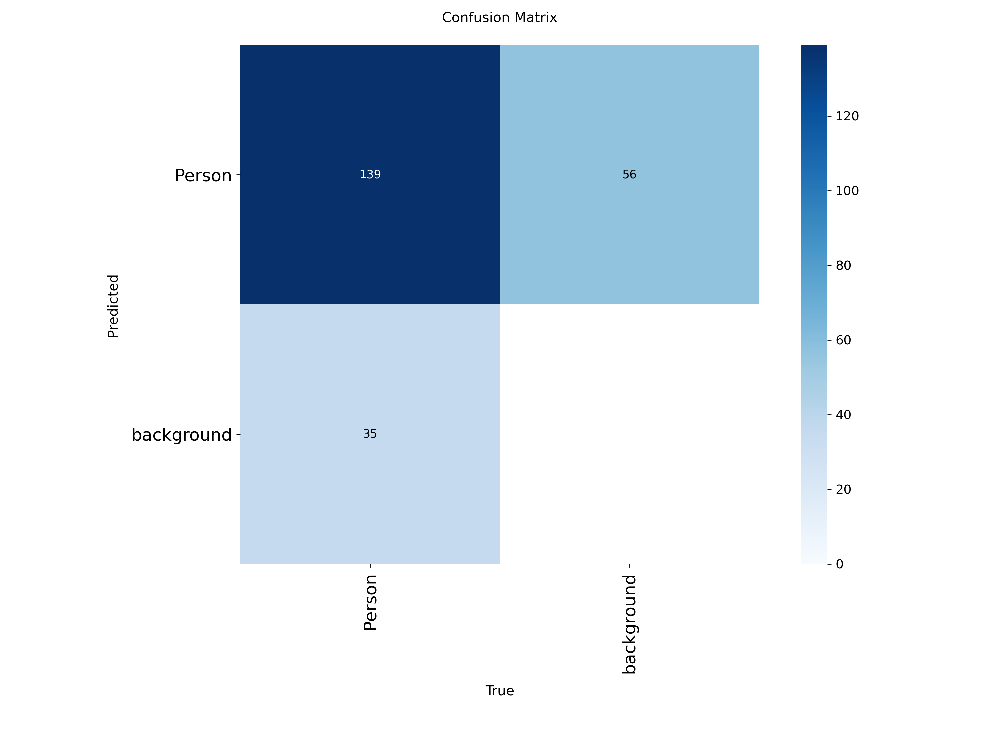

In [7]:
from ultralytics import YOLO
from IPython.display import Image, display
from pathlib import Path

# Load best trained model
model = YOLO(
    "/content/runs/detect/"
    "people_count_model/weights/best.pt"
)

# Evaluate and create confusion matrix
results = model.val(
    data="/content/people_count.yaml",
    split="test",
    imgsz=640,
    conf=0.25,
    plots=True
)

# Display confusion matrix
matrix_path = (
    Path(results.save_dir) /
    "confusion_matrix.png"
)

display(Image(filename=str(matrix_path), width=800))

In [8]:
import torch
from ultralytics import YOLO

device = 0 if torch.cuda.is_available() else "cpu"

# Load best trained model
model = YOLO(
    "/content/runs/detect/"
    "people_count_model/weights/best.pt"
)

# Test on the test dataset
results = model.val(
    data="/content/people_count.yaml",
    split="test",
    imgsz=640,
    batch=16 if device == 0 else 4,
    conf=0.25,
    device=device,
    plots=True
)

print(f"Precision: {results.box.mp:.4f}")
print(f"Recall: {results.box.mr:.4f}")
print(f"mAP50: {results.box.map50:.4f}")
print(f"mAP50-95: {results.box.map:.4f}")

Ultralytics 8.4.115 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 73 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2386.1±807.9 MB/s, size: 62.9 KB)
val: Scanning /content/people_count_dataset/test/labels.cache... 59 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 59/59 20.6Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.1it/s 3.7s
                   all         59        174      0.853       0.77      0.774      0.473
Speed: 19.6ms preprocess, 6.5ms inference, 0.0ms loss, 5.5ms postprocess per image
Results saved to /content/runs/detect/val-2
Precision: 0.8528
Recall: 0.7701
mAP50: 0.7738
mAP50-95: 0.4730


In [12]:
import torch
import cv2
import subprocess
from collections import defaultdict
from ultralytics import YOLO
from google.colab import files
from IPython.display import display, clear_output, Video
from PIL import Image

device = 0 if torch.cuda.is_available() else "cpu"

model = YOLO(
    "/content/runs/detect/"
    "people_count_model/weights/best.pt"
)

# Upload video
uploaded = files.upload()
video_path = next(iter(uploaded))

video = cv2.VideoCapture(video_path)

if not video.isOpened():
    raise ValueError("Could not open uploaded video.")

fps = video.get(cv2.CAP_PROP_FPS)
width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
total_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))

if fps <= 0:
    fps = 25

# Horizontal counting line
line_y = int(height * 0.55)
line_margin = max(8, int(height * 0.01))

temporary_output = "/content/people_count_temp.mp4"
final_output = "/content/people_count_result.mp4"

writer = cv2.VideoWriter(
    temporary_output,
    cv2.VideoWriter_fourcc(*"mp4v"),
    fps,
    (width, height)
)

if not writer.isOpened():
    raise ValueError("Could not create output video.")

# Tracking and counting variables
previous_centers = {}
track_hits = defaultdict(int)
counted_ids = set()

entered_count = 0
exited_count = 0
frame_number = 0

while video.isOpened():
    success, frame = video.read()

    if not success:
        break

    result = model.track(
        source=frame,
        conf=0.30,
        iou=0.50,
        imgsz=640,
        device=device,
        tracker="bytetrack.yaml",
        persist=True,
        verbose=False
    )[0]

    # Only tracked detections are counted
    if (
        result.boxes is not None
        and result.boxes.id is not None
    ):
        boxes = result.boxes.xyxy.cpu().numpy()
        track_ids = result.boxes.id.int().cpu().tolist()
        confidences = result.boxes.conf.cpu().tolist()
    else:
        boxes = []
        track_ids = []
        confidences = []

    # Current visible people with sufficient confidence
    in_frame_count = sum(
        confidence >= 0.30
        for confidence in confidences
    )

    for box, track_id, confidence in zip(
        boxes, track_ids, confidences
    ):
        if confidence < 0.30:
            continue

        x1, y1, x2, y2 = map(int, box)

        center_x = int((x1 + x2) / 2)
        center_y = int((y1 + y2) / 2)

        track_hits[track_id] += 1

        # Require a track to appear in at least 3 frames
        if (
            track_id in previous_centers
            and track_hits[track_id] >= 3
            and track_id not in counted_ids
        ):
            previous_y = previous_centers[track_id][1]

            # Moving downward across the line
            if (
                previous_y < line_y - line_margin
                and center_y >= line_y + line_margin
            ):
                entered_count += 1
                counted_ids.add(track_id)

            # Moving upward across the line
            elif (
                previous_y > line_y + line_margin
                and center_y <= line_y - line_margin
            ):
                exited_count += 1
                counted_ids.add(track_id)

        previous_centers[track_id] = (
            center_x,
            center_y
        )

    total_count = entered_count + exited_count

    # Draw detection boxes and IDs
    detected_frame = result.plot(
        line_width=1,
        font_size=8,
        labels=True,
        conf=True
    )

    # Draw counting line
    cv2.line(
        detected_frame,
        (0, line_y),
        (width, line_y),
        (255, 150, 0),
        3
    )

    cv2.putText(
        detected_frame,
        "COUNTING LINE",
        (20, line_y - 12),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.65,
        (255, 150, 0),
        2
    )

    # Information panel
    cv2.rectangle(
        detected_frame,
        (15, 15),
        (350, 155),
        (0, 0, 0),
        -1
    )

    cv2.putText(
        detected_frame,
        f"In Frame Count: {in_frame_count}",
        (25, 50),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.70,
        (0, 255, 0),
        2
    )

    cv2.putText(
        detected_frame,
        f"Entered: {entered_count}",
        (25, 82),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.70,
        (0, 255, 255),
        2
    )

    cv2.putText(
        detected_frame,
        f"Exited: {exited_count}",
        (25, 114),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.70,
        (255, 200, 0),
        2
    )

    cv2.putText(
        detected_frame,
        f"Total Count: {total_count}",
        (25, 146),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.70,
        (0, 165, 255),
        2
    )

    writer.write(detected_frame)

    # Live preview every three frames
    if frame_number % 3 == 0:
        preview = cv2.cvtColor(
            detected_frame,
            cv2.COLOR_BGR2RGB
        )

        clear_output(wait=True)
        print(
            f"Processing: {frame_number}/{total_frames}"
        )
        display(Image.fromarray(preview))

    frame_number += 1

video.release()
writer.release()

# Convert to compatible MP4 and preserve audio
subprocess.run([
    "ffmpeg", "-y",
    "-i", temporary_output,
    "-i", video_path,
    "-map", "0:v:0",
    "-map", "1:a:0?",
    "-c:v", "libx264",
    "-preset", "fast",
    "-crf", "23",
    "-pix_fmt", "yuv420p",
    "-c:a", "aac",
    "-shortest",
    "-movflags", "+faststart",
    final_output
], check=True)

clear_output(wait=True)

print("In final frame:", in_frame_count)
print("Entered:", entered_count)
print("Exited:", exited_count)
print("Total:", total_count)

display(Video(final_output, embed=True, width=800))
files.download(final_output)

In final frame: 25
Entered: 1
Exited: 0
Total: 1


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [13]:
tracker_config = """
tracker_type: botsort
track_high_thresh: 0.35
track_low_thresh: 0.10
new_track_thresh: 0.40
track_buffer: 120
match_thresh: 0.80
fuse_score: True
gmc_method: sparseOptFlow
proximity_thresh: 0.50
appearance_thresh: 0.80
with_reid: True
model: auto
"""

tracker_path = "/content/botsort_reid.yaml"

with open(tracker_path, "w") as file:
    file.write(tracker_config)

print("Tracker configuration created.")

Tracker configuration created.


In [14]:
import torch
import cv2
import subprocess
from collections import defaultdict
from ultralytics import YOLO
from google.colab import files
from IPython.display import display, clear_output, Video
from PIL import Image

device = 0 if torch.cuda.is_available() else "cpu"

model = YOLO(
    "/content/runs/detect/"
    "people_count_model/weights/best.pt"
)

uploaded = files.upload()
video_path = next(iter(uploaded))

video = cv2.VideoCapture(video_path)

if not video.isOpened():
    raise ValueError("Could not open the video.")

fps = video.get(cv2.CAP_PROP_FPS)
width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
total_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))

if fps <= 0:
    fps = 25

temporary_output = "/content/unique_people_temp.mp4"
final_output = "/content/unique_people_result.mp4"

writer = cv2.VideoWriter(
    temporary_output,
    cv2.VideoWriter_fourcc(*"mp4v"),
    fps,
    (width, height)
)

# Number of frames in which each ID appears
track_hits = defaultdict(int)

# IDs accepted as real people
confirmed_ids = set()

# Require a person to appear for at least 5 frames
minimum_track_frames = 5
frame_number = 0

while video.isOpened():
    success, frame = video.read()

    if not success:
        break

    # BoT-SORT tracking with appearance ReID
    result = model.track(
        source=frame,
        conf=0.30,
        iou=0.50,
        imgsz=640,
        device=device,
        tracker="/content/botsort_reid.yaml",
        persist=True,
        verbose=False
    )[0]

    current_ids = []

    if (
        result.boxes is not None
        and result.boxes.id is not None
    ):
        tracking_ids = (
            result.boxes.id
            .int()
            .cpu()
            .tolist()
        )

        confidences = (
            result.boxes.conf
            .cpu()
            .tolist()
        )

        for track_id, confidence in zip(
            tracking_ids, confidences
        ):
            if confidence < 0.30:
                continue

            current_ids.append(track_id)
            track_hits[track_id] += 1

            # Confirm only stable tracking IDs
            if track_hits[track_id] >= minimum_track_frames:
                confirmed_ids.add(track_id)

    # IDs currently visible
    visible_confirmed_ids = {
        track_id
        for track_id in current_ids
        if track_id in confirmed_ids
    }

    in_frame_count = len(visible_confirmed_ids)
    total_unique_count = len(confirmed_ids)

    detected_frame = result.plot(
        line_width=1,
        font_size=8,
        labels=True,
        conf=True
    )

    # Information panel
    cv2.rectangle(
        detected_frame,
        (15, 15),
        (390, 110),
        (0, 0, 0),
        -1
    )

    cv2.putText(
        detected_frame,
        f"In Frame Count: {in_frame_count}",
        (25, 53),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.75,
        (0, 255, 0),
        2
    )

    cv2.putText(
        detected_frame,
        f"Whole Video Total: {total_unique_count}",
        (25, 92),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.75,
        (0, 255, 255),
        2
    )

    writer.write(detected_frame)

    if frame_number % 3 == 0:
        preview = cv2.cvtColor(
            detected_frame,
            cv2.COLOR_BGR2RGB
        )

        clear_output(wait=True)
        print(
            f"Processing: {frame_number}/{total_frames}"
        )
        display(Image.fromarray(preview))

    frame_number += 1

video.release()
writer.release()

# Convert video and retain original audio
subprocess.run([
    "ffmpeg", "-y",
    "-i", temporary_output,
    "-i", video_path,
    "-map", "0:v:0",
    "-map", "1:a:0?",
    "-c:v", "libx264",
    "-preset", "fast",
    "-crf", "23",
    "-pix_fmt", "yuv420p",
    "-c:a", "aac",
    "-shortest",
    "-movflags", "+faststart",
    final_output
], check=True)

clear_output(wait=True)

print("Whole-video unique people:", len(confirmed_ids))
print("Saved video:", final_output)

display(Video(final_output, embed=True, width=800))
files.download(final_output)

Whole-video unique people: 78
Saved video: /content/unique_people_result.mp4


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [15]:
import os
import torch
import cv2
import subprocess
import numpy as np
from collections import defaultdict
from ultralytics import YOLO
from google.colab import files
from IPython.display import display, clear_output, Video
from PIL import Image

device = 0 if torch.cuda.is_available() else "cpu"

model = YOLO(
    "/content/runs/detect/"
    "people_count_model/weights/best.pt"
)

# Use custom ReID tracker if available
tracker_path = (
    "/content/botsort_reid.yaml"
    if os.path.exists("/content/botsort_reid.yaml")
    else "botsort.yaml"
)

# Upload video
uploaded = files.upload()
video_path = next(iter(uploaded))

video = cv2.VideoCapture(video_path)

if not video.isOpened():
    raise ValueError("Could not open video.")

fps = video.get(cv2.CAP_PROP_FPS)
width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
total_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))

if fps <= 0:
    fps = 25

# Define region using video dimensions
# Change these points to move or resize the region
region = np.array([
    [int(width * 0.20), int(height * 0.25)],
    [int(width * 0.80), int(height * 0.25)],
    [int(width * 0.80), int(height * 0.90)],
    [int(width * 0.20), int(height * 0.90)]
], dtype=np.int32)

temporary_output = "/content/region_count_temp.mp4"
final_output = "/content/region_count_result.mp4"

writer = cv2.VideoWriter(
    temporary_output,
    cv2.VideoWriter_fourcc(*"mp4v"),
    fps,
    (width, height)
)

# Tracking information
previous_inside_state = {}
track_hits = defaultdict(int)
entered_ids = set()

minimum_track_frames = 3
frame_number = 0

while video.isOpened():
    success, frame = video.read()

    if not success:
        break

    result = model.track(
        source=frame,
        conf=0.30,
        iou=0.50,
        imgsz=640,
        device=device,
        tracker=tracker_path,
        persist=True,
        verbose=False
    )[0]

    current_inside_ids = set()

    if (
        result.boxes is not None
        and result.boxes.id is not None
    ):
        boxes = result.boxes.xyxy.cpu().numpy()
        track_ids = result.boxes.id.int().cpu().tolist()
        confidences = result.boxes.conf.cpu().tolist()

        for box, track_id, confidence in zip(
            boxes, track_ids, confidences
        ):
            if confidence < 0.30:
                continue

            track_hits[track_id] += 1

            x1, y1, x2, y2 = map(int, box)

            # Use bottom-center of bounding box
            # This represents the person's ground position
            center_x = int((x1 + x2) / 2)
            center_y = int(y2)

            is_inside = (
                cv2.pointPolygonTest(
                    region,
                    (center_x, center_y),
                    False
                ) >= 0
            )

            if is_inside:
                current_inside_ids.add(track_id)

            previous_inside = previous_inside_state.get(
                track_id,
                False
            )

            # Count when person moves outside → inside
            if (
                is_inside
                and not previous_inside
                and track_hits[track_id] >= minimum_track_frames
                and track_id not in entered_ids
            ):
                entered_ids.add(track_id)

            previous_inside_state[track_id] = is_inside

    inside_region_count = len(current_inside_ids)
    total_entered_count = len(entered_ids)

    detected_frame = result.plot(
        line_width=1,
        font_size=8,
        labels=True,
        conf=True
    )

    # Transparent green region
    overlay = detected_frame.copy()

    cv2.fillPoly(
        overlay,
        [region],
        (0, 180, 0)
    )

    detected_frame = cv2.addWeighted(
        overlay,
        0.20,
        detected_frame,
        0.80,
        0
    )

    # Region border
    cv2.polylines(
        detected_frame,
        [region],
        True,
        (0, 255, 0),
        3
    )

    cv2.putText(
        detected_frame,
        "COUNTING REGION",
        tuple(region[0]),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.65,
        (0, 255, 0),
        2
    )

    # Count panel
    cv2.rectangle(
        detected_frame,
        (15, 15),
        (370, 110),
        (0, 0, 0),
        -1
    )

    cv2.putText(
        detected_frame,
        f"Inside Region: {inside_region_count}",
        (25, 53),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.75,
        (0, 255, 0),
        2
    )

    cv2.putText(
        detected_frame,
        f"Total Entered: {total_entered_count}",
        (25, 92),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.75,
        (0, 255, 255),
        2
    )

    writer.write(detected_frame)

    if frame_number % 3 == 0:
        preview = cv2.cvtColor(
            detected_frame,
            cv2.COLOR_BGR2RGB
        )

        clear_output(wait=True)
        print(f"Processing: {frame_number}/{total_frames}")
        display(Image.fromarray(preview))

    frame_number += 1

video.release()
writer.release()

# Create compatible MP4 and retain audio
subprocess.run([
    "ffmpeg", "-y",
    "-i", temporary_output,
    "-i", video_path,
    "-map", "0:v:0",
    "-map", "1:a:0?",
    "-c:v", "libx264",
    "-preset", "fast",
    "-crf", "23",
    "-pix_fmt", "yuv420p",
    "-c:a", "aac",
    "-shortest",
    "-movflags", "+faststart",
    final_output
], check=True)

clear_output(wait=True)

print("Total unique people entered:", len(entered_ids))
display(Video(final_output, embed=True, width=800))
files.download(final_output)

Total unique people entered: 13


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>